In [2]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

import cmocean
import cartopy.crs as ccrs

In [3]:
plt.style.use("~/nice.mplstyle")

In [4]:
metric = "rmse"
spatial = {
    name: xr.open_dataset(
        f"/pscratch/sd/t/timothys/nested-eagle/v0/baselines/{key}-forecasts-vs-hrrr-analysis/spatial.{metric}.lam.nc",
        decode_timedelta=True,
    )
    for name, key in zip(["HRRR", "GFS"], ["hrrr", "gfs"])
}
spatial["Nested-EAGLE Prototype"] = xr.open_dataset(f"/pscratch/sd/t/timothys/nested-eagle/v0/10percent/mmgt/inference-validation/spatial.{metric}.nested-lam.nc", decode_timedelta=True)

In [5]:
spatial = {k: spatial[k] for k in ["Nested-EAGLE Prototype", "HRRR", "GFS"]}

In [6]:
nice_names = {
    "sp": "Surface Pressure",
    "u10": "10m Zonal Wind",
    "v10": "10m Meridional Wind",
    "t2m": "2m Temperature",
    "sh2": "2m Specific Humidity",
    "gh": "Geopotential Height",
    "u": "Zonal Wind",
    "v": "Meridional Wind",
    "w": "Vertical Velocity",
    "t": "Temperature",
    "q": "Specific Humidity",
}

In [7]:
vmax = {
    "sp": 200,
    "u10": 2,
    "v10": 2,
    "t2m": 2,
    "sh2": 2e-3,
    "gh": 600,
    "u": 2,
    "v": 2,
    "w": .1,
    "t": 2,
    "q": .001,
}

In [10]:
def plot_surface_error(surface_vars, fhr, level=None, **kwargs):
    ncols = len(spatial)
    nrows = len(surface_vars)
    fig, axs = plt.subplots(
        nrows, ncols,
        figsize=(6.5*ncols, 4*nrows),
        constrained_layout=True,
        subplot_kw={
            "projection": ccrs.Orthographic(262.5, 35),
            #"projection": ccrs.Robinson(262.5, 20),
        },
    )

    for varname, axr in zip(surface_vars, axs):
        for (label, xds), ax in zip(spatial.items(), axr):
            p = ax.scatter(
                spatial["HRRR"].longitude,
                spatial["HRRR"].latitude,
                c=xds[varname].sel(fhr=fhr),
                vmin=0.,
                vmax=vmax[varname],
                transform=ccrs.PlateCarree(),
                cmap="cmo.amp",
            )
            sps = ax.get_subplotspec()
            ax.set(
                title=label if sps.is_first_row() else ""
            )
            ax.axis("off")
            if sps.is_last_col():
                plt.colorbar(p, ax=ax, label=nice_names[varname], shrink=.6, extend="max")
    return fig, axs

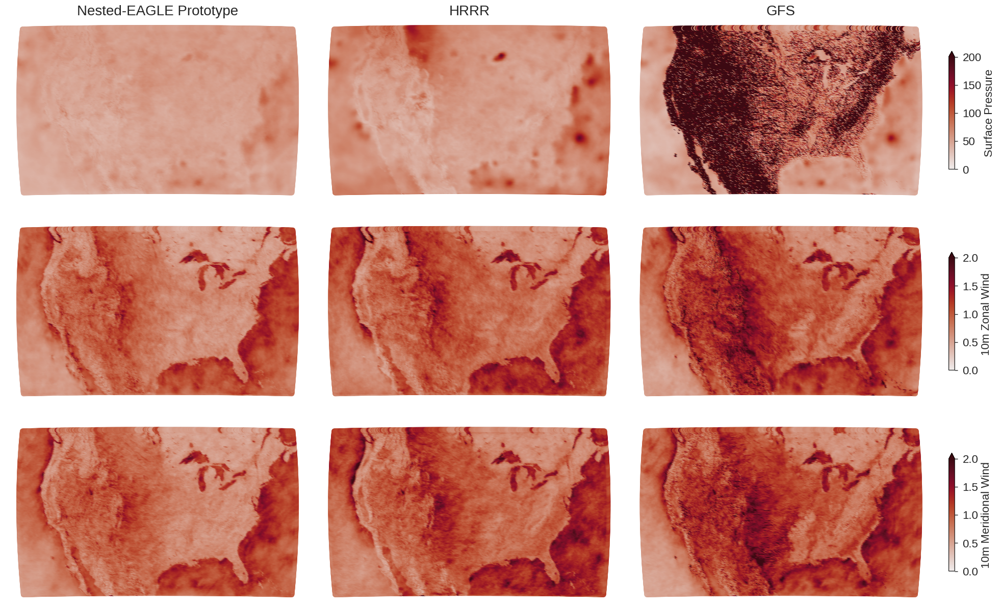

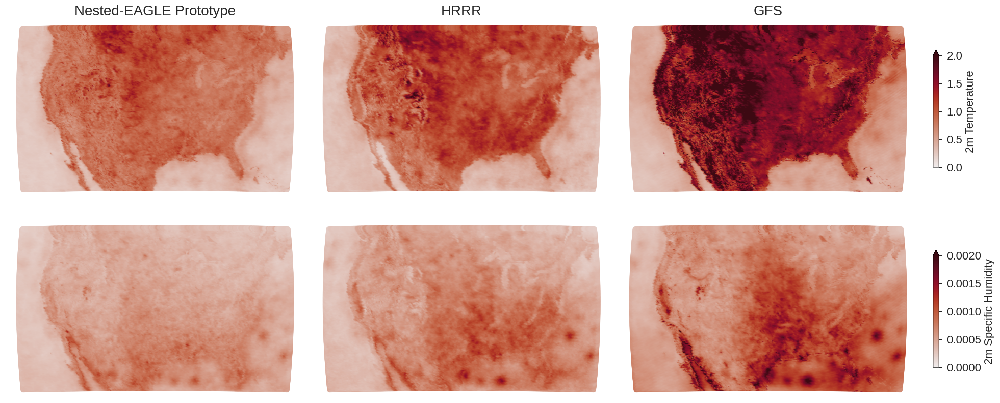

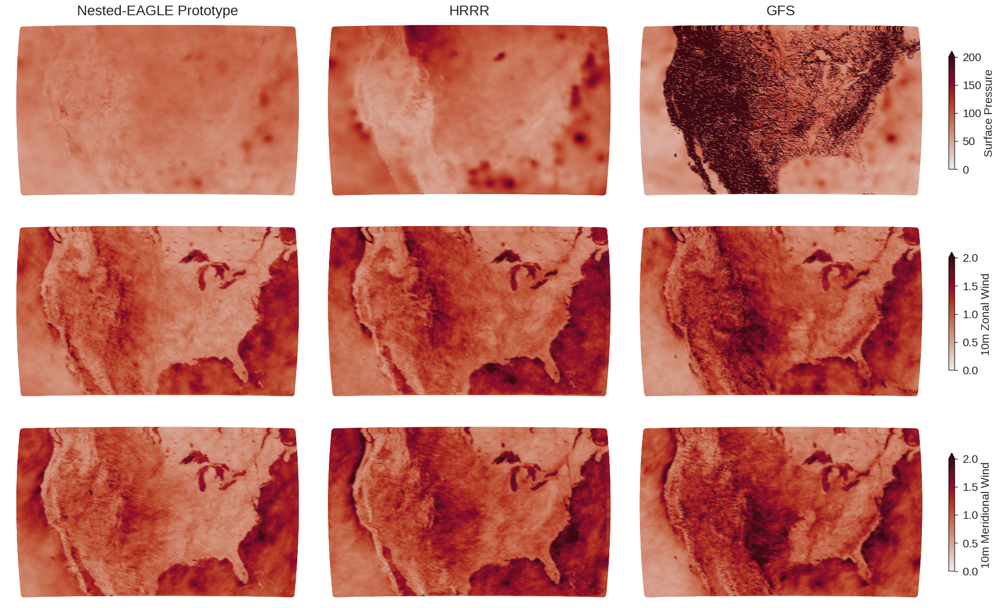

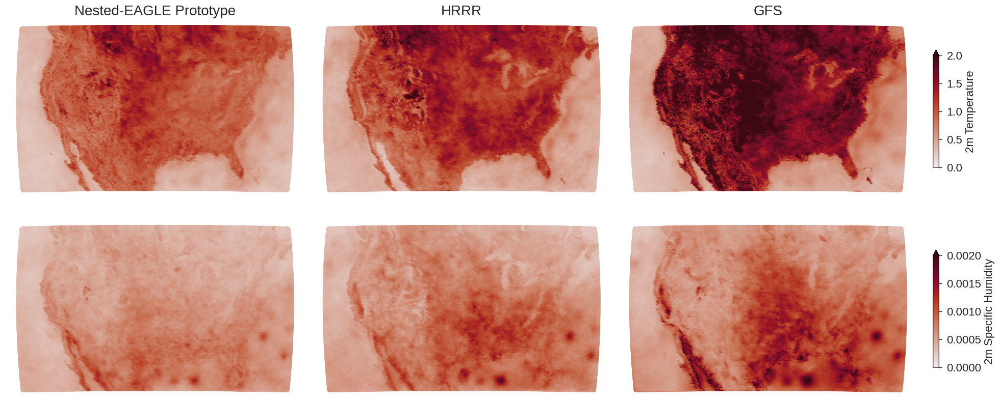

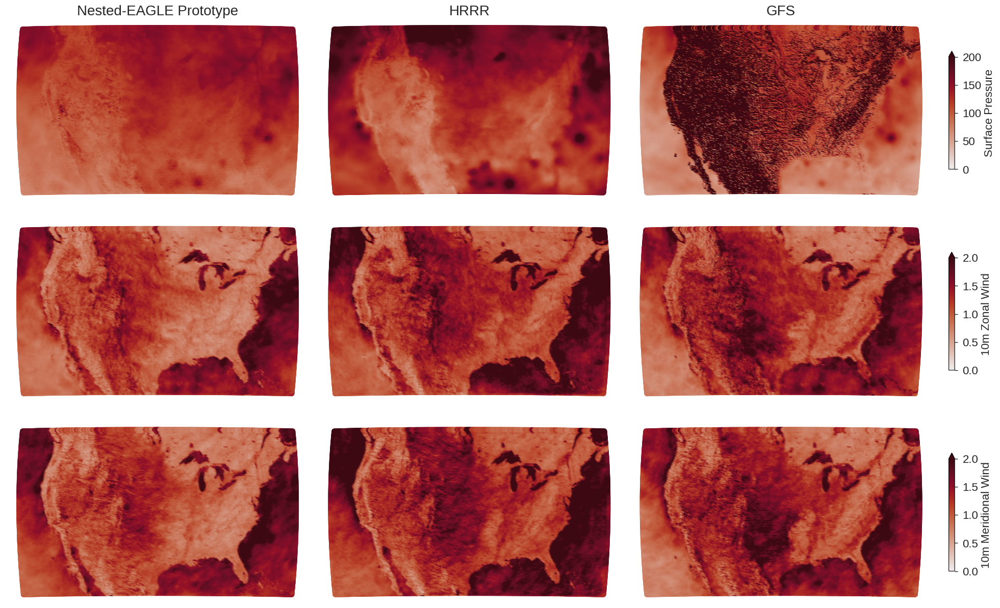

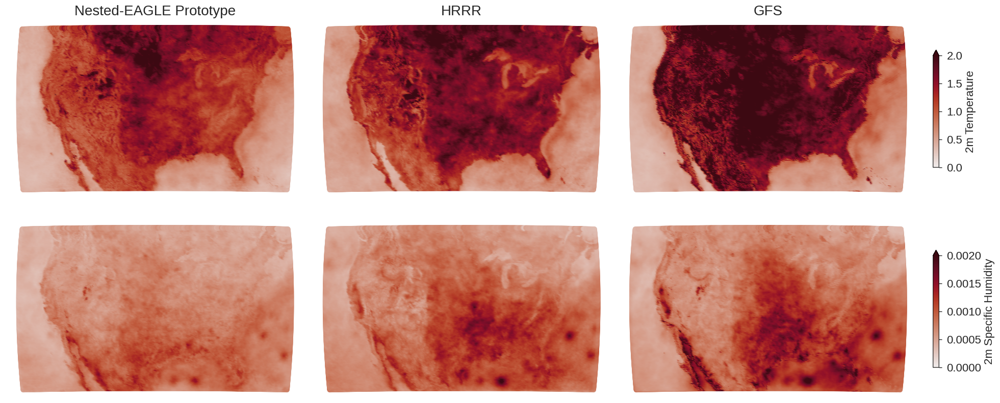

In [80]:
for fhr in [12, 24, 48]:
    fig, axs = plot_surface_error(["sp", "u10", "v10"], fhr=fhr)
    fig.savefig(f"figures/spatial_rmse_surface_momentum_{fhr}h.jpeg", dpi=300, bbox_inches="tight")
    fig, axs = plot_surface_error(["t2m", "sh2"], fhr=fhr)
    fig.savefig(f"figures/spatial_rmse_surface_thermo_{fhr}h.jpeg", dpi=300, bbox_inches="tight")